In [ ]:
import numpy as np
import pandas as pd
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import _stop_words

In [ ]:
reddit_df = pd.read_csv("Cleaned_dataset.csv")

In [ ]:
reddit_df.head()

,Unnamed: 0,ID,Timestamp,Upvotes,Comments,Cleaned_Title,Cleaned_Content
0,0,1j6j0hp,2025-03-08 15:04:18,1,0,hoowee dark week end nigh,sooner optimistically posted rcptsd depression...
1,1,1j6itc3,2025-03-08 14:54:40,1,0,im tired fucking existential crisis,want play videogames im thinking remember real...
2,2,1j6ioj2,2025-03-08 14:48:04,3,0,want emotional pain,whenever feel free anxiety depression sadness ...
3,3,1j6ijka,2025-03-08 14:41:05,1,0,feeling like someone deserves feel way,years years ive said bad things ive done bad t...
4,4,1j6hm3j,2025-03-08 13:53:34,5,4,motivation move,hi ive always bit life since younger always us...


In [ ]:
nltk.download("vader_lexicon")
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


In [ ]:
reddit_df["Combined_Text"] = reddit_df["Cleaned_Title"]  + " " + reddit_df["Cleaned_Content"]

def get_vader_sentiment(text):
    score = sia.polarity_scores(text)["compound"]
    if score > 0.2:
        return "Positive"
    elif score < -0.2:
        return "Negative"
    else:
        return "Neutral"

reddit_df["Sentiment"] = reddit_df["Combined_Text"].apply(get_vader_sentiment)

tfidf = TfidfVectorizer(max_features=1000, stop_words="english", ngram_range=(1,2))
tfidf_matrix = tfidf.fit_transform(reddit_df["Combined_Text"])
feature_names = tfidf.get_feature_names_out()

tfidf_scores = pd.DataFrame(tfidf_matrix.toarray(), columns=feature_names)
Important_Terms = tfidf_scores.mean().sort_values(ascending=False)[:20].index.tolist()

def classify_risk(text, sentiment):
    text = text.lower()
    high_risk_terms = ["suicide","suicidal", "kill myself", "end it", "i give up", "overdose", "goodbye", "can't go on", "commit suicide", "die", "kill", "attempt","ending life", "end life"]
    moderate_risk_terms = ["depressed", "addiction", "rehab", "cannabis", "molly", "heroin", "marijuana", "fentanyl", "pot", "hopeless", "numb", "empty", "need help", "worthless", "anxious", "panic attack", "im high", "drug"]


    if sentiment == "Negative" or sentiment=="Neutral":
        if any(term in text for term in high_risk_terms):
            return "High-Risk"
        elif any(term in text for term in moderate_risk_terms):
            return "Moderate Concern"

    return "Low Concern"

reddit_df["Risk_Level"] = reddit_df.apply(lambda row: classify_risk(row["Combined_Text"], row["Sentiment"]), axis=1)

<ipython-input-6-74124c608d4a>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette={"Positive": "green", "Neutral": "gray", "Negative": "red"})


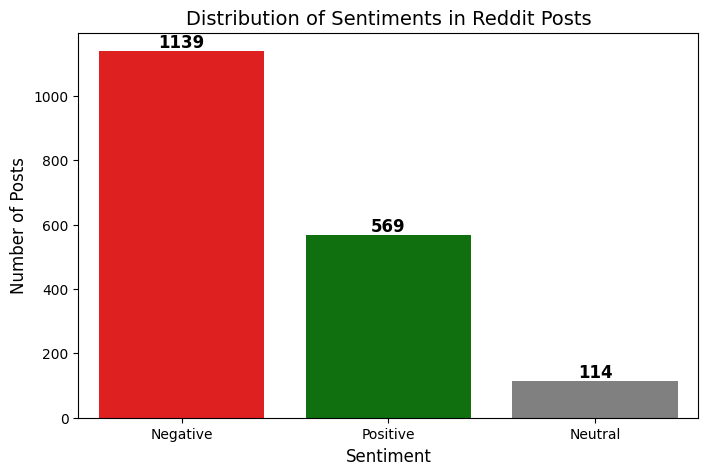

In [ ]:
sentiment_counts = reddit_df["Sentiment"].value_counts()

plt.figure(figsize=(8, 5))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette={"Positive": "green", "Neutral": "gray", "Negative": "red"})

plt.xlabel("Sentiment", fontsize=12)
plt.ylabel("Number of Posts", fontsize=12)
plt.title("Distribution of Sentiments in Reddit Posts", fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

for index, value in enumerate(sentiment_counts.values):
    plt.text(index, value + 10, str(value), ha="center", fontsize=12, fontweight="bold")

plt.show()

<ipython-input-7-272528743099>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=risk_counts.index, y=risk_counts.values, palette={"Low Concern": "green", "Moderate Concern": "gray", "High-Risk": "red"})


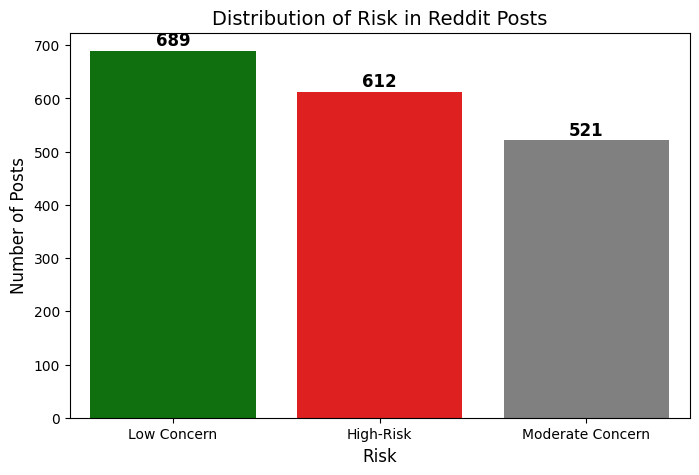

In [ ]:
risk_counts = reddit_df["Risk_Level"].value_counts()

plt.figure(figsize=(8, 5))
sns.barplot(x=risk_counts.index, y=risk_counts.values, palette={"Low Concern": "green", "Moderate Concern": "gray", "High-Risk": "red"})

plt.xlabel("Risk", fontsize=12)
plt.ylabel("Number of Posts", fontsize=12)
plt.title("Distribution of Risk in Reddit Posts", fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

for index, value in enumerate(risk_counts.values):
    plt.text(index, value + 10, str(value), ha="center", fontsize=12, fontweight="bold")

plt.show()

In [ ]:
temp = reddit_df["Risk_Level"] == "Moderate Concern"
temp = reddit_df[temp]
temp = temp["Combined_Text"]
temp

,Combined_Text
2,want emotional pain whenever feel free anxiety...
3,feeling like someone deserves feel way years y...
5,writing sometimes cant get back lost feel like...
8,depressed lazy got sick overnight hate life mo...
9,broke front tooth years braces making depresse...
...,...
1711,im tired im sorry long annoying need vent some...
1725,really teetering edge finally know want todo l...
1758,really need help hello im dealing depression a...
1775,please give reasons stay everything falling ap...


In [ ]:
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.expand_frame_repr", False)
pd.set_option("display.max_colwidth", None)

In [ ]:
negative_texts = reddit_df[reddit_df["Sentiment"].isin(["Negative", "Neutral"])]["Combined_Text"]
high_risk_texts = reddit_df[reddit_df["Risk_Level"] == "High-Risk"]["Combined_Text"]
moderate_risk_texts = reddit_df[reddit_df["Risk_Level"]=="Moderate Concern"]["Combined_Text"]


In [ ]:

tfidf_high = TfidfVectorizer(
    max_features=500,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8

)
tfidf_moderate = TfidfVectorizer(
    max_features=500,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8

)
tfidf_high.fit(negative_texts)
tfidf_moderate.fit(negative_texts)
tfidf_matrix_high = tfidf_high.transform(high_risk_texts)
tfidf_matrix_moderate = tfidf_moderate.transform(moderate_risk_texts)
feature_names_high = tfidf_high.get_feature_names_out()
feature_names_moderate = tfidf_moderate.get_feature_names_out()

tfidf_scores_high = pd.DataFrame(tfidf_matrix_high.toarray(), columns=feature_names_high)
tfidf_scores_moderate = pd.DataFrame(tfidf_matrix_moderate.toarray(), columns=feature_names_moderate)
important_terms_high = tfidf_scores_high.mean().sort_values(ascending=False)[:30].index.tolist()
important_terms_moderate = tfidf_scores_moderate.mean().sort_values(ascending=False)[:30].index.tolist()

print(f"High risk terms:{important_terms_high}\n")
print(f"Moderate risk terms:{important_terms_moderate}")


High risk terms:['im', 'dont', 'want', 'like', 'feel', 'life', 'know', 'die', 'ive', 'suicidal', 'people', 'really', 'dont know', 'years', 'time', 'help', 'going', 'think', 'anymore', 'hate', 'feel like', 'want die', 'day', 'thoughts', 'things', 'suicide', 'fucking', 'family', 'dont want', 'kill']

Moderate risk terms:['im', 'feel', 'dont', 'like', 'addiction', 'ive', 'know', 'life', 'want', 'time', 'depressed', 'really', 'day', 'help', 'need', 'dont know', 'years', 'stop', 'people', 'going', 'feeling', 'feel like', 'got', 'think', 'bad', 'anxiety', 'things', 'way', 'work', 'depression']


In [ ]:
generic_words=[]
for i in important_terms_high:
  if i in Important_Terms:
    generic_words.append(i)


for i in important_terms_moderate:
  if i in Important_Terms:
    generic_words.append(i)

generic_words

['im',
 'dont',
 'want',
 'like',
 'feel',
 'life',
 'know',
 'ive',
 'people',
 'really',
 'dont know',
 'years',
 'time',
 'help',
 'going',
 'think',
 'feel like',
 'day',
 'im',
 'feel',
 'dont',
 'like',
 'addiction',
 'ive',
 'know',
 'life',
 'want',
 'time',
 'really',
 'day',
 'help',
 'need',
 'dont know',
 'years',
 'people',
 'going',
 'feel like',
 'think']

In [ ]:
custom_stopwords = set(_stop_words.ENGLISH_STOP_WORDS).union(generic_words)
custom_stopwords = list(custom_stopwords)
tfidf_new_high = TfidfVectorizer(
    max_features=500,
    stop_words=custom_stopwords,
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8 )
tfidf_new_moderate = TfidfVectorizer(
    max_features=500,
    stop_words=custom_stopwords,
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8 )
tfidf_new_high.fit(negative_texts)
tfidf_new_moderate.fit(negative_texts)
tfidf_matrix_new_high = tfidf_new_high.transform(high_risk_texts)
tfidf_matrix_new_moderate = tfidf_new_moderate.transform(moderate_risk_texts)
feature_names_new_high = tfidf_new_high.get_feature_names_out()
feature_names_new_moderate = tfidf_new_moderate.get_feature_names_out()


tfidf_scores_new_high = pd.DataFrame(tfidf_matrix_new_high.toarray(), columns=feature_names_new_high)
tfidf_scores_new_moderate = pd.DataFrame(tfidf_matrix_new_moderate.toarray(), columns=feature_names_new_moderate)
important_terms_new_high = tfidf_scores_new_high.mean().sort_values(ascending=False)[:150].index.tolist()
important_terms_new_moderate = tfidf_scores_new_moderate.mean().sort_values(ascending=False)[:150].index.tolist()

print("Refined High-Risk Terms:", important_terms_new_high)
print("\n")
print("Refined Moderate-Risk Terms:", important_terms_new_moderate)

Refined High-Risk Terms: ['die', 'suicidal', 'anymore', 'hate', 'suicide', 'things', 'thoughts', 'fucking', 'kill', 'family', 'live', 'way', 'got', 'didnt', 'friends', 'job', 'end', 'depression', 'work', 'talk', 'school', 'tired', 'pain', 'make', 'better', 'depressed', 'feeling', 'care', 'bad', 'say', 'person', 'lost', 'tried', 'try', 'ill', 'told', 'parents', 'said', 'good', 'wish', 'suicidal thoughts', 'scared', 'year', 'thought', 'started', 'trying', 'stop', 'point', 'doesnt', 'feels', 'love', 'living', 'tell', 'thats', 'thinking', 'thing', 'hard', 'times', 'right', 'felt', 'worse', 'getting', 'old', 'hes', 'away', 'months', 'mind', 'shit', 'world', 'mom', 'left', 'lot', 'death', 'mental', 'self', 'ago', 'wanted', 'days', 'reason', 'hurt', 'long', 'sleep', 'wanna', 'maybe', 'killing', 'home', 'actually', 'money', 'used', 'went', 'friend', 'dad', 'struggling', 'able', 'shes', 'happy', 'makes', 'past', 'anxiety', 'week', 'body', 'id', 'wont', 'drugs', 'wasnt', 'wrong', 'sad', 'theres'

In [ ]:
distinct_high_risk_terms = list(set(important_terms_new_high) - set(important_terms_new_moderate))
print("Distinct High-Risk Terms:", distinct_high_risk_terms)

Distinct High-Risk Terms: ['idk', 'die', 'stupid', 'hurt', 'worthless', 'head', 'shes', 'suicide', 'kill', 'wasnt', 'college', 'room', 'gets', 'world', 'today', 'mother', 'everyday', 'house', 'died', 'best', 'problems', 'brain', 'gonna', 'little', 'friend', 'matter', 'constantly', 'alive', 'future', 'gone', 'death', 'killing', 'understand', 'leave', 'dad', 'suicidal', 'fuck', 'thoughts', 'care', 'said', 'suicidal thoughts', 'believe']


In [ ]:
distinct_moderate_risk_terms = list(set(important_terms_new_moderate) - set(important_terms_new_high))
print("Distinct moderate-Risk Terms:", distinct_moderate_risk_terms)

Distinct moderate-Risk Terms: ['drug', 'numb', 'quit', 'cocaine', 'alcohol', 'normal', 'addict', 'problem', 'sure', 'addicted', 'starting', 'place', 'hopeless', 'hours', 'smoking', 'using', 'anxious', 'weed', 'real', 'guess', 'finally', 'issues', 'month', 'panic', 'porn', 'social', 'change', 'struggle', 'phone', 'looking', 'whats', 'couple', 'medication', 'sober', 'cause', 'fear', 'relationship', 'use', 'watching', 'lonely', 'stay', 'advice']


In [ ]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

def filter_generic_words(word_list, additional_stopwords=None):
    """
    Removes generic words (stopwords, common Reddit terms, etc.) from a given word list.

    Args:
        word_list (list): List of words to filter.
        additional_stopwords (set): Optional additional words to remove.

    Returns:
        list: Filtered list with generic words removed.
    """

    reddit_stopwords = {"post", "deleted", "edit", "comments", "account", "people", "really",
                        "like", "just", "know", "think", "said", "man", "going","ok","tells", "asked","us","want","human", "im", "dont"}


    stopword_set = ENGLISH_STOP_WORDS.union(reddit_stopwords)
    if additional_stopwords:
        stopword_set = stopword_set.union(additional_stopwords)


    filtered_words = [word for word in word_list if word.lower() not in stopword_set]

    return filtered_words

In [ ]:
negative_texts

,Combined_Text
1,im tired fucking existential crisis want play videogames im thinking remember reality time remember lot videogames closed way play anymore lot games hidden somewhere deep internet ill never find even though lot games play still think things change time example versions game things change something gets deleted something added game lot things never happen games basically wasnt specific time wasnt specific person want live every life possible impossible universe want everything possible impossible universe reality impossible killing im thinking much things like making mental state lot worse thing movies books lot books existing world anymore lot books never published lot books would find life read killing want literally everything everything exists existed even never existed want literally everything reality impossible cant live reality im scared time scared unavailability scared seeing something im scared everything reality universe terrible cant live world uncomfortable problem unusual way get accept move forward cant tried accept reality whole life seems impossible way get everything know everything try everything everything literally everything fact killing want die badly cant live reality discomfort anxiety lot specific things problem dont see sense saying one going help anyway want die cant continue living reality reality hurtful uncomfortable
2,want emotional pain whenever feel free anxiety depression sadness pain miss like want something bad happen want depressed almost pains much want feel emotional pain dont comes especially im alonenot anythingbored however actually feel negative things dont like feel like cant handle
3,feeling like someone deserves feel way years years ive said bad things ive done bad things ive said done weird things ive said done confusing things im sure anyone whos friends knew everything said wouldnt want around anymore blame im disgusted wanted change didnt tried change many times failed nobody seems care even family even friends probably deserve sometimes think boring person daydream time instead things probably worth time try stop good reason cant maybe born nobody useless worthless unwanted unlikable weirdo ugly talentless uninteresting disgusting
4,motivation move hi ive always bit life since younger always used bad sad feelings help motivate would trained exercised much always tried get stuck new stuff learn new skills recently though lost motivation always used think use feeling crap time advantage feelings never changed accepted still feelings physically even move outside obligations even type sat floor wondering anyone else went situation accepted constantly feel got hit wall light sight cares needed
5,writing sometimes cant get back lost feel like reminders around hurt seem like old really matter hard change mean anything people really discouraging course youre supposed change want forgiven get new chance things want future trying everything better person suck awful actions spending months trying rid addiction bad habits feeling alone depressed grieving loss regretting lot things people say patient youre patient might miss things youve always dreamed consequences guess severe think harder people dishing consequences understand pain enough dont feel pain want hurt people dont give chance keep changes made dropping back bad habits loss trying hardest want things bad scummy gross regular every day things entitled entitled brat childish know deserve consequences enough feel hurt im devastated loss fear feel helpless hopeless
7,currently extremely depressed thinking ending life community talk freely things
8,depressed lazy got sick overnight hate life motivation anything social life dont study literally stay home day nothing yet im always tired sleep day days im even lazy shower friends one texting im even lazy put show watch doom scroll started got sick anxiety got worse im scared go anxiety starts get dizzy sick bought books planner actually excited living going improving 

In [ ]:
from sklearn.feature_selection import chi2
import numpy as np

tfidf_shared = TfidfVectorizer(
    max_features=3000,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8
)
negative_df = reddit_df[reddit_df["Sentiment"].isin(["Negative", "Neutral"])]

X_combined = tfidf_shared.fit_transform(negative_texts)
y_combined = (negative_df["Risk_Level"] == "High-Risk").astype(int)

chi2_scores, p_values = chi2(X_combined, y_combined)
feature_names = tfidf_shared.get_feature_names_out()
top_chi2_indices = np.argsort(chi2_scores)[::-1][:60]
top_chi2_words = feature_names[top_chi2_indices]

significant_words = [word for i, word in enumerate(top_chi2_words) if p_values[top_chi2_indices[i]] < 0.25]
print("**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**")
print(filter_generic_words(significant_words, additional_stopwords=None))

**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**
['die', 'suicidal', 'want die', 'suicide', 'kill', 'suicidal thoughts', 'addiction', 'killing', 'porn', 'thoughts', 'died', 'fucking', 'attempt', 'death', 'live', 'im suicidal', 'skills', 'want kill', 'quit', 'killed', 'attempts', 'addicted', 'ideation', 'weed', 'die im', 'cravings', 'commit suicide', 'life', 'ive suicidal', 'commit', 'suicidal ideation', 'siblings', 'relapse', 'alive', 'kill im', 'hospital', 'goodbye', 'care', 'attempted', 'die dont', 'smoking', 'suffer', 'feeling suicidal', 'die want', 'addictions', 'going kill', 'end life', 'want live', 'overdose', 'relapsed', 'kms', 'hurt', 'truly', 'panic', 'symptoms', 'sober', 'ending life', 'addict']


In [ ]:
tfidf_shared_moderate = TfidfVectorizer(
    max_features=3000,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=0.0,
    max_df=0.8
)


X_combined_moderate = tfidf_shared_moderate.fit_transform(reddit_df["Combined_Text"])
y_combined_moderate = (reddit_df["Risk_Level"] == "Moderate Concern").astype(int)

chi2_scores_moderate, p_values_moderate = chi2(X_combined_moderate, y_combined_moderate)
feature_names_moderate = tfidf_shared_moderate.get_feature_names_out()
top_chi2_indices_moderate = np.argsort(chi2_scores_moderate)[::-1][:60]
top_chi2_words_moderate = feature_names_moderate[top_chi2_indices_moderate]

significant_words_moderate = [word for i, word in enumerate(top_chi2_words_moderate) if p_values_moderate[top_chi2_indices_moderate[i]] < 0.25]
print("**Top Moderate-Risk Indicator Words by Chi-Square Test (Filtered):**")
print(filter_generic_words(significant_words_moderate, additional_stopwords=significant_words))

**Top Moderate-Risk Indicator Words by Chi-Square Test (Filtered):**
['depressed', 'anxious', 'panic attacks', 'attacks', 'numb', 'panic attack', 'instagram', 'ssris', 'attack', 'derealization', 'triggered', 'love', 'dishes', 'visa', 'anxiety', 'friend', 'im depressed', 'best', 'feeling depressed', 'lost', 'overwhelmed', 'acts', 'community', 'realizing', 'test', 'highschool', 'best friend', 'stressed', 'regularly', 'abusing']


In [ ]:
from gensim.models import Word2Vec
nltk.download('punkt_tab')


negative_texts["Tokenized"] = negative_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])
moderate_risk_texts["Tokenized"] = moderate_risk_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])
w2v_model = Word2Vec(sentences=negative_texts["Tokenized"], vector_size=100, window=5, min_count=3, workers=4)
w2v_model_moderate = Word2Vec(sentences=moderate_risk_texts["Tokenized"], vector_size=100, window=5, min_count=3, workers=4)

seed_words = filter_generic_words(significant_words)
seed_words_moderate = filter_generic_words(significant_words_moderate)
expanded_words = {}
expanded_words_moderate= {}
for word in seed_words:
    if word in w2v_model.wv:
        expanded_words[word] = filter_generic_words([w[0] for w in w2v_model.wv.most_similar(word, topn=10)], additional_stopwords=["simply","bring","knowing","continue","became","highschool","began","full","university","older","obviously","however","put","instead","check","name","true","writing","hobbies","fully","kinda","idk","point","normal","including","eventually"])

for word in seed_words_moderate:
    if word in w2v_model_moderate.wv:
        expanded_words_moderate[word] = filter_generic_words([w[0] for w in w2v_model_moderate.wv.most_similar(word, topn=10)], additional_stopwords=["simply","bring","knowing","continue","became","highschool","began","full","university","older","obviously","however","put","instead","check","name","true","writing","hobbies","fully","kinda","idk","point","normal","including","eventually"])
print("Expanded High-Risk Words:", expanded_words)
print("\n")
print("Expanded moderate-Risk Words:", expanded_words_moderate)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
<ipython-input-20-a1f23e694138>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_texts["Tokenized"] = negative_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])
<ipython-input-20-a1f23e694138>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  moderate_risk_texts["Tokenized"] = moderate_risk_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])


Expanded High-Risk Words: {'die': ['anymore', 'feel', 'hate', 'wan'], 'suicidal': ['thoughts', 'struggling', 'gotten', 'dealing', 'depressive', 'getting', 'f', 'episodes', 'havent', 'struggled'], 'suicide': ['physically', 'heart', 'stuff', 'cold', 'fine', 'fear', 'feelings', 'probably', 'seeing'], 'kill': ['understand', 'stop', 'whats', 'ill', 'end', 'doesnt'], 'addiction': ['drug', 'alcohol', 'low', 'caused', 'led', 'porn', 'symptoms', 'abuse', 'therapy'], 'killing': ['deep', 'cycle', 'head', 'idea', 'absolutely', 'takes', 'guys', 'fact', 'control', 'wouldnt'], 'porn': ['drug', 'gave', 'age', 'treatment', 'alcohol', 'therapy', 'car', 'cocaine', 'bit'], 'thoughts': ['decade', 'struggling', 'ideation', 'harm', 'lot', 'getting', 'suicidal', 'depressive', 'episodes', 'using'], 'died': ['weed', 'turned', 'using', 'thought', 'clean', 'stopped', 'taking', 'mg', 'episode', 'college'], 'fucking': ['deserve', 'life', 'kill', 'way', 'end', 'understand', 'stop'], 'attempt': ['boyfriend', 'partner

In [ ]:
results = {}
for key_word, words in expanded_words.items():

    valid_words = [word for word in words if word in feature_names_new_high]

    if not valid_words:
        continue


    high_risk_scores = tfidf_scores_new_high[valid_words].mean()
    moderate_risk_scores = tfidf_scores_new_moderate[valid_words].mean()


    score_difference = (high_risk_scores - moderate_risk_scores).sort_values(ascending=False)


    X_high = tfidf_matrix_new_high.toarray()
    X_moderate = tfidf_matrix_new_moderate.toarray()

    y_high = np.ones(X_high.shape[0])
    y_moderate = np.zeros(X_moderate.shape[0])

    X_combined = np.vstack((X_high, X_moderate))
    y_combined = np.hstack((y_high, y_moderate))

    chi2_scores, p_values = chi2(X_combined, y_combined)


    word_chi2_scores = {word: chi2_scores[np.where(feature_names_new_high == word)[0][0]]
                        for word in valid_words}


    results[key_word] = {
        "valid_words": valid_words,
        "score_difference": score_difference.to_dict(),
        "chi2_scores": word_chi2_scores
    }


df_results = pd.DataFrame.from_dict(results, orient='index')


print(df_results)

                                                                               valid_words                                                                                                                                                                                                                                                                                                                              score_difference                                                                                                                                                                                                                                                                                                     chi2_scores
die                                                                        [anymore, hate]                                                                                                                                                                                     

In [ ]:
df_results.shape
df_results.iloc[10]

,attempt
valid_words,"[boyfriend, partner, country, heart, experience, use, class]"
score_difference,"{'boyfriend': 0.004440609702429326, 'country': 0.001934261261030138, 'class': 0.0010103185372101302, 'heart': -0.0003512838399244503, 'partner': -0.0009654218141610764, 'use': -0.00360182468735523, 'experience': -0.004459457852565439}"
chi2_scores,"{'boyfriend': 0.6473594099884987, 'partner': 0.03229377508373085, 'country': 0.1838345950372267, 'heart': 0.004073822577345508, 'experience': 0.6889505230625514, 'use': 0.32840441076906624, 'class': 0.04850112258446075}"


In [ ]:
chi2_values_00000 =df_results["chi2_scores"].apply(lambda x: np.mean(list(x.values())) if x else 0)

print(chi2_values_00000)

die           1.904816
suicidal      0.919572
suicide       0.067632
kill          0.712557
addiction     1.563057
killing       0.383231
porn          0.510097
thoughts      5.285032
died          0.870024
fucking       3.541155
attempt       0.276203
death         0.400349
live          1.284294
skills        0.295972
quit          0.376762
killed        0.143459
attempts      0.628862
addicted      1.432259
ideation      1.506715
weed          0.581271
cravings      0.208320
life          1.296486
commit        0.446590
siblings      0.299204
relapse       0.303477
alive         0.564256
hospital      0.215475
goodbye       0.102419
care          1.967672
attempted     0.776382
smoking       0.910471
suffer        0.257396
addictions    0.107378
overdose      0.563010
relapsed      1.013712
kms           1.542756
hurt          0.770431
truly         0.847850
panic         1.787581
symptoms      0.297249
sober         0.824643
addict        0.470293
Name: chi2_scores, dtype: float64


In [ ]:
threshold_chi2 = 1

for key in df_results.index:
    valid_words = df_results.at[key, "valid_words"]
    chi2_scores = df_results.at[key, "chi2_scores"]
    score_diff = df_results.at[key, "score_difference"]

    filtered_words = [
        word for word in valid_words
        if chi2_scores.get(word, 0) >= threshold_chi2 and score_diff.get(word, 0) > 0
    ]

    filtered_chi2 = {word: chi2_scores[word] for word in filtered_words}
    filtered_score_diff = {word: score_diff[word] for word in filtered_words}

    df_results.at[key, "valid_words"] = filtered_words
    df_results.at[key, "chi2_scores"] = filtered_chi2
    df_results.at[key, "score_difference"] = filtered_score_diff

In [ ]:
df_results

,valid_words,score_difference,chi2_scores
die,"[anymore, hate]","{'anymore': 0.014948752301776287, 'hate': 0.015192873724142457}","{'anymore': 1.8434213831344397, 'hate': 1.9662097592815901}"
suicidal,[thoughts],{'thoughts': 0.0227336526577827},{'thoughts': 6.2476871824553655}
suicide,[],{},{}
kill,[end],{'end': 0.01150992586161001},{'end': 1.6938768144189258}
addiction,[],{},{}
killing,[],{},{}
porn,[treatment],{'treatment': 0.004833365868212219},{'treatment': 1.529550834145184}
thoughts,[suicidal],{'suicidal': 0.057060833560894746},{'suicidal': 29.728694285226155}
died,[thought],{'thought': 0.010177441405272592},{'thought': 1.6900996065861889}
fucking,"[kill, end]","{'kill': 0.03339765177220092, 'end': 0.01150992586161001}","{'kill': 17.40017657331667, 'end': 1.6938768144189258}"


In [ ]:
chi2_values_ = df_results["chi2_scores"].apply(lambda x: np.mean(list(x.values())) if x else 0)

print(chi2_values_)

die            1.904816
suicidal       6.247687
suicide        0.000000
kill           1.693877
addiction      0.000000
killing        0.000000
porn           1.529551
thoughts      29.728694
died           1.690100
fucking        9.547027
attempt        0.000000
death          1.226335
live           2.906490
skills         0.000000
quit           0.000000
killed         0.000000
attempts       1.349055
addicted       0.000000
ideation       1.529551
weed           0.000000
cravings       0.000000
life           3.393979
commit         1.226335
siblings       0.000000
relapse        0.000000
alive          1.543815
hospital       0.000000
goodbye        0.000000
care           4.564983
attempted      0.000000
smoking        0.000000
suffer         0.000000
addictions     0.000000
overdose       1.020009
relapsed       0.000000
kms            5.244400
hurt           1.878376
truly          2.866546
panic          1.364138
symptoms       0.000000
sober          0.000000
addict         1

In [ ]:
filtered_chi2_values = chi2_values_[chi2_values_ > 0]
print(filtered_chi2_values)

die          1.904816
suicidal     6.247687
kill         1.693877
porn         1.529551
thoughts    29.728694
died         1.690100
fucking      9.547027
death        1.226335
live         2.906490
attempts     1.349055
ideation     1.529551
life         3.393979
commit       1.226335
alive        1.543815
care         4.564983
overdose     1.020009
kms          5.244400
hurt         1.878376
truly        2.866546
panic        1.364138
addict       1.020009
Name: chi2_scores, dtype: float64


In [ ]:
filtered_rows = df_results.loc[chi2_values_ > 0]
High_risk_valid_words_dict = {}

for key in filtered_rows.index:
    valid_words = df_results.at[key, "valid_words"]
    High_risk_valid_words_dict[key] = valid_words

print(High_risk_valid_words_dict)

{'die': ['anymore', 'hate'], 'suicidal': ['thoughts'], 'kill': ['end'], 'porn': ['treatment'], 'thoughts': ['suicidal'], 'died': ['thought'], 'fucking': ['kill', 'end'], 'death': ['god'], 'live': ['care'], 'attempts': ['treatment', 'mom'], 'ideation': ['treatment'], 'life': ['fucking', 'end'], 'commit': ['god'], 'alive': ['hurt', 'world'], 'care': ['live'], 'overdose': ['child'], 'kms': ['ones', 'killing'], 'hurt': ['love', 'alive'], 'truly': ['god', 'death'], 'panic': ['severe'], 'addict': ['child']}


In [ ]:
results_moderate = {}
for key_word, words in expanded_words_moderate.items():

    valid_words = [word for word in words if word in feature_names_new_moderate]

    if not valid_words:
        continue


    high_risk_scores = tfidf_scores_new_high[valid_words].mean()
    moderate_risk_scores = tfidf_scores_new_moderate[valid_words].mean()


    score_difference = (moderate_risk_scores - high_risk_scores).sort_values(ascending=False)


    X_high = tfidf_matrix_new_high.toarray()
    X_moderate = tfidf_matrix_new_moderate.toarray()

    y_high = np.zeros(X_high.shape[0])
    y_moderate = np.ones(X_moderate.shape[0])

    X_combined = np.vstack((X_moderate, X_high))
    y_combined = np.hstack((y_moderate, y_high))

    chi2_scores, p_values = chi2(X_combined, y_combined)


    word_chi2_scores = {word: chi2_scores[np.where(feature_names_new_moderate == word)[0][0]]
                        for word in valid_words}


    results_moderate[key_word] = {
        "valid_words": valid_words,
        "score_difference": score_difference.to_dict(),
        "chi2_scores": word_chi2_scores
    }


df_results_moderate = pd.DataFrame.from_dict(results_moderate, orient='index')


print(df_results_moderate)

                                                                         valid_words                                                                                                                                                                                                                                                           score_difference                                                                                                                                                                                                                                             chi2_scores
panic                                         [days, got, started, hes, lot, family]                                                                                {'days': 0.005107317323662517, 'started': 0.0028133752003070174, 'lot': 0.0025844546079310388, 'got': 0.00015944485303789196, 'hes': -0.005244386124350018, 'family': -0.01162400842160069}                                                 

In [ ]:
df_results_moderate.shape
df_results_moderate.iloc[10]

,derealization
valid_words,"[especially, struggling, shit, say]"
score_difference,"{'struggling': -0.0007394600100138447, 'especially': -0.0017063963099291975, 'shit': -0.003642858375261883, 'say': -0.008045546156992728}"
chi2_scores,"{'especially': 0.1146227942044023, 'struggling': 0.009817632943536977, 'shit': 0.2115840841436663, 'say': 0.8926521846256188}"


In [ ]:
chi2_values_000 =df_results_moderate["chi2_scores"].apply(lambda x: np.mean(list(x.values())) if x else 0)

print(chi2_values_000)

panic            0.399422
depressed        0.220928
anxious          0.233563
addiction        0.428049
attacks          0.614147
numb             0.504853
instagram        0.131251
ssris            1.246724
thoughts         0.430779
attack           0.412054
derealization    0.307169
triggered        1.302768
love             0.468428
dishes           0.122470
visa             0.303544
anxiety          0.500425
friend           0.509937
best             0.302177
live             0.273096
lost             0.542218
overwhelmed      0.734748
acts             0.311602
realizing        0.836381
test             0.496585
care             0.516670
highschool       0.510740
stressed         0.362060
life             1.021838
regularly        0.839030
truly            0.306523
abusing          0.723790
Name: chi2_scores, dtype: float64


In [ ]:
threshold_chi2 = 1

for key in df_results_moderate.index:
    valid_words = df_results_moderate.at[key, "valid_words"]
    chi2_scores = df_results_moderate.at[key, "chi2_scores"]
    score_diff = df_results_moderate.at[key, "score_difference"]

    filtered_words = [
        word for word in valid_words
        if chi2_scores.get(word, 0) >= threshold_chi2 and score_diff.get(word, 0) > 0
    ]

    filtered_chi2 = {word: chi2_scores[word] for word in filtered_words}
    filtered_score_diff = {word: score_diff[word] for word in filtered_words}

    df_results_moderate.at[key, "valid_words"] = filtered_words
    df_results_moderate.at[key, "chi2_scores"] = filtered_chi2
    df_results_moderate.at[key, "score_difference"] = filtered_score_diff

In [ ]:
df_results_moderate

,valid_words,score_difference,chi2_scores
panic,[],{},{}
depressed,[],{},{}
anxious,[],{},{}
addiction,[],{},{}
attacks,[anxiety],{'anxiety': 0.012022308395218326},{'anxiety': 1.9464964824160482}
numb,[],{},{}
instagram,[],{},{}
ssris,[watching],{'watching': 0.006857209112226308},{'watching': 1.6865013592939033}
thoughts,[],{},{}
attack,[],{},{}


In [ ]:
Moderate_Risk_words = df_results_moderate.index.tolist()
Moderate_Risk_words

['panic',
 'depressed',
 'anxious',
 'addiction',
 'attacks',
 'numb',
 'instagram',
 'ssris',
 'thoughts',
 'attack',
 'derealization',
 'triggered',
 'love',
 'dishes',
 'visa',
 'anxiety',
 'friend',
 'best',
 'live',
 'lost',
 'overwhelmed',
 'acts',
 'realizing',
 'test',
 'care',
 'highschool',
 'stressed',
 'life',
 'regularly',
 'truly',
 'abusing']

In [ ]:
Moderate_Risk_Words_Final = ['panic','depressed','anxious','addiction','attacks','numb','ssris','thoughts','attack','derealization','triggered',
 'love','visa','anxiety','friend','best','live','lost','overwhelmed','test','realizing','care','highschool','stressed','life',
 'truly']

In [ ]:
tfidf_vectorizer_bg_high = TfidfVectorizer(ngram_range=(2,3), max_features=100)
tfidf_matrix_bg_high = tfidf_vectorizer_bg_high.fit_transform(high_risk_texts)
feature_names_bg_high = tfidf_vectorizer_bg_high.get_feature_names_out()
tfidf_scores_bg_high = pd.DataFrame(tfidf_matrix_bg_high.toarray(), columns=feature_names_bg_high)
important_terms_bg_high = tfidf_scores_bg_high.mean().sort_values(ascending=False)[:30].index.tolist()



In [ ]:
tfidf_scores_bg_high.columns

Index(['anymore im', 'anyone else', 'cant afford', 'cant even', 'cant find',
       'cant get', 'cant help', 'cant stop', 'cant take', 'didnt want',
       'die die', 'die die die', 'dont care', 'dont even', 'dont even know',
       'dont feel', 'dont feel like', 'dont get', 'dont know',
       'dont know anymore', 'dont know im', 'dont like', 'dont really',
       'dont see', 'dont think', 'dont understand', 'dont wanna', 'dont want',
       'dont want die', 'entire life', 'even get', 'even know', 'even though',
       'ever since', 'every day', 'every single', 'every single day',
       'every time', 'everyone else', 'feel alone', 'feel guilty', 'feel like',
       'feel like im', 'feeling like', 'feels like', 'felt like', 'first time',
       'get better', 'go back', 'high school', 'im afraid', 'im depressed',
       'im going', 'im gonna', 'im really', 'im scared', 'im still',
       'im suicidal', 'im sure', 'im tired', 'im trying', 'ive always',
       'ive done', 'ive never', 'i

In [ ]:
tfidf_shared_bg = TfidfVectorizer(
    max_features=100,
    stop_words="english",
    ngram_range=(2, 3),
    min_df=3,
    max_df=0.8
)
negative_df = reddit_df[reddit_df["Sentiment"] == "Negative"]

X_combined_bg = tfidf_shared_bg.fit_transform(negative_df["Combined_Text"])
y_combined_bg = (negative_df["Risk_Level"] == "High-Risk").astype(int)

chi2_scores_bg, p_values_bg = chi2(X_combined_bg, y_combined_bg)
feature_names_bg = tfidf_shared_bg.get_feature_names_out()
top_chi2_indices_bg = np.argsort(chi2_scores_bg)[::-1][:60]
top_chi2_words_bg = feature_names_bg[top_chi2_indices_bg]

significant_words_bg = [word for i, word in enumerate(top_chi2_words_bg) if p_values_bg[top_chi2_indices_bg[i]] < 0.25]
print("**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**")
print(significant_words_bg)

**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**
['want die', 'suicidal thoughts', 'want kill', 'want live', 'panic attacks', 'panic attack', 'really want', 'dont care', 'dont want', 'im going', 'single day', 'die die', 'life im', 'really dont', 'im fucking', 'hate hate', 'things like', 'past months', 'people say', 'self harm', 'really bad', 'life ive', 'help im', 'ive lost', 'dont understand', 'feel like']


In [ ]:
high_risk_chi2_values = [
    (feature_names_bg[i], chi2_scores_bg[i])
    for i in top_chi2_indices_bg if p_values_bg[i] < 0.25
]

high_risk_chi2_values.sort(key=lambda x: x[1], reverse=True)

print("**Top 30 High-Risk Indicator Words with Chi-Square Scores:**")
for word, score in high_risk_chi2_values:
    print(f"{word}: {score:.4f}")

**Top 30 High-Risk Indicator Words with Chi-Square Scores:**
want die: 51.9492
suicidal thoughts: 34.4832
want kill: 12.1448
want live: 5.6408
panic attacks: 5.3569
panic attack: 4.1286
really want: 2.8608
dont care: 2.7702
dont want: 2.6448
im going: 2.5956
single day: 2.5197
die die: 2.4513
life im: 2.4272
really dont: 2.3899
im fucking: 2.3898
hate hate: 2.3174
things like: 2.1647
past months: 2.0825
people say: 1.8234
self harm: 1.7999
really bad: 1.7621
life ive: 1.4686
help im: 1.4591
ive lost: 1.4377
dont understand: 1.4351
feel like: 1.3640


In [ ]:
filtered_high_bg = [
    (word, score) for word, score in high_risk_chi2_values if score >= 4
]
filtered_high_bg

[('want die', 51.94918669289822),
 ('suicidal thoughts', 34.483150089470406),
 ('want kill', 12.144773734301557),
 ('want live', 5.640813541088869),
 ('panic attacks', 5.356877095090133),
 ('panic attack', 4.128595982522716)]

In [ ]:
High_risk_crisis_terms = [word for word, score in filtered_high_bg]
print(High_risk_crisis_terms)

['want die', 'suicidal thoughts', 'want kill', 'want live', 'panic attacks', 'panic attack']


In [ ]:
for term in High_risk_crisis_terms:
    if term not in High_risk_valid_words_dict:
        High_risk_valid_words_dict[term] = []

print(High_risk_valid_words_dict)

{'die': ['anymore', 'hate'], 'suicidal': ['thoughts'], 'kill': ['end'], 'porn': ['treatment'], 'thoughts': ['suicidal'], 'died': ['thought'], 'fucking': ['kill', 'end'], 'death': ['god'], 'live': ['care'], 'attempts': ['treatment', 'mom'], 'ideation': ['treatment'], 'life': ['fucking', 'end'], 'commit': ['god'], 'alive': ['hurt', 'world'], 'care': ['live'], 'overdose': ['child'], 'kms': ['ones', 'killing'], 'hurt': ['love', 'alive'], 'truly': ['god', 'death'], 'panic': ['severe'], 'addict': ['child'], 'want die': [], 'suicidal thoughts': [], 'want kill': [], 'want live': [], 'panic attacks': [], 'panic attack': []}


In [ ]:
dictionary_keys_list = list(High_risk_valid_words_dict.keys())
print(dictionary_keys_list)

['die', 'suicidal', 'kill', 'porn', 'thoughts', 'died', 'fucking', 'death', 'live', 'attempts', 'ideation', 'life', 'commit', 'alive', 'care', 'overdose', 'kms', 'hurt', 'truly', 'panic', 'addict', 'want die', 'suicidal thoughts', 'want kill', 'want live', 'panic attacks', 'panic attack']


In [ ]:
dictionary_keys_list = ['die', 'suicidal', 'kill', 'attempt', 'death', 'live fucking', 'fucking live', 'killed', 'commit', 'relapse','attempt', 'alive', 'suffer', 'overdose', 'kms', 'want die', 'suicidal thoughts', 'want kill', 'dont want live','panick attacks','panick attack' ]

In [ ]:
def contains_high_risk_terms(text):
    text_lower = text.lower()
    return any(term in text_lower for term in dictionary_keys_list)

reddit_df_new = reddit_df.copy()

reddit_df_new["Risk_Adjusted"] = reddit_df_new["Risk_Level"]

mask = (reddit_df_new["Risk_Level"] == "Moderate Concern") & (reddit_df_new["Combined_Text"].apply(contains_high_risk_terms))
reddit_df_new.loc[mask, "Risk_Adjusted"] = "High-Risk"

print(f"Relabeled {mask.sum()} posts from 'Moderate Concern' to 'High-Risk'.")

Relabeled 84 posts from 'Moderate Concern' to 'High-Risk'.


In [ ]:
relabeled_posts = reddit_df_new[mask]
print(relabeled_posts)

      Unnamed: 0       ID            Timestamp  Upvotes  Comments                                                     Cleaned_Title                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [ ]:
print(reddit_df_new["Risk_Adjusted"].value_counts())

Risk_Adjusted
High-Risk           696
Low Concern         689
Moderate Concern    437
Name: count, dtype: int64


In [ ]:
from sklearn.decomposition import LatentDirichletAllocation


high_risk_df_new = reddit_df_new[reddit_df_new["Risk_Adjusted"] == "High-Risk"]
moderate_risk_df_new = reddit_df_new[reddit_df_new["Risk_Adjusted"] == "Moderate Concern"]


def apply_lda(texts, num_topics=5, max_features=1000):
    tfidf_vectorizer_new = TfidfVectorizer(
        max_features=max_features, stop_words="english", ngram_range=(1, 2), min_df=3, max_df=0.8
    )
    X_tfidf = tfidf_vectorizer_new.fit_transform(texts)

    lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
    lda.fit(X_tfidf)

    feature_names_new = tfidf_vectorizer_new.get_feature_names_out()

    return lda, tfidf_vectorizer_new, feature_names_new


lda_high, tfidf_vectorizer_high, feature_names_new_high = apply_lda(high_risk_df_new["Combined_Text"])
lda_moderate, tfidf_vectorizer_moderate, feature_names_new_moderate = apply_lda(moderate_risk_df_new["Combined_Text"])


def get_lda_features(model, texts, vectorizer):
    X_tfidf = vectorizer.transform(texts)
    return model.transform(X_tfidf)



def print_topics(model, feature_names_new, title, num_words=10):
    print(f"\n **{title}**")
    for topic_idx, topic in enumerate(model.components_):
        top_words = [feature_names_new[i] for i in topic.argsort()[:-num_words - 1:-1]]
        print(f"**Topic {topic_idx + 1}:** {', '.join(top_words)}")

print_topics(lda_high, feature_names_new_high, "High-Risk Topics")
print_topics(lda_moderate, feature_names_new_moderate, "Moderate-Risk Topics")


 **High-Risk Topics**
**Topic 1:** die die, ugly, die im, unbearable, xanax, commit suicide, calling, easily, kill, piece
**Topic 2:** dont, like, feel, want, life, ive, know, people, time, die
**Topic 3:** xanax, prescribed, mg, run, bought, know dont, asleep, piece, car, small
**Topic 4:** die die, ugly, die im, unbearable, xanax, commit suicide, calling, easily, kill, piece
**Topic 5:** withdrawal, kill, week, die die, ugly, die im, xanax, unbearable, commit suicide, calling

 **Moderate-Risk Topics**
**Topic 1:** addiction, music, addict, lived, works, brother, gambling, experience, struggling, alcohol
**Topic 2:** anxious, wonder, calm, drinking, everyday, youre, addiction, behavioral, social media, media
**Topic 3:** ssris, alcohol, state, behaviour, depressed, share, addiction, current, therapy, wanted
**Topic 4:** im, feel, dont, like, ive, know, life, want, addiction, time
**Topic 5:** behavioral, research, study, substance, sexual, effects, speaking, questions, learn, reach


In [ ]:
X_lda_high = get_lda_features(lda_high, reddit_df_new[ "Combined_Text"], tfidf_vectorizer_high)
X_lda_moderate = get_lda_features(lda_moderate,  reddit_df_new["Combined_Text"], tfidf_vectorizer_moderate)

X_lda_combined = np.hstack((X_lda_high, X_lda_moderate))

In [ ]:
import torch
from transformers import BertTokenizer, BertModel
from sklearn.preprocessing import MultiLabelBinarizer

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
bert_model = BertModel.from_pretrained("bert-base-uncased")
bert_model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def get_bert_embeddings(texts, batch_size=32):
    bert_model.to(device)
    embeddings = []
    texts = [str(text) if isinstance(text, str) else "" for text in texts]

    for i in range(0, len(texts), batch_size):
        batch_texts = texts[i:i+batch_size]


        inputs = tokenizer(batch_texts, padding=True, truncation=True, max_length=512, return_tensors="pt")
        inputs = {key: val.to(device) for key, val in inputs.items()}

        with torch.no_grad():
            outputs = bert_model(**inputs)

        batch_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()  # Move back to CPU
        embeddings.append(batch_embeddings)

    return np.vstack(embeddings)

X_bert = get_bert_embeddings(reddit_df_new[ "Combined_Text"])

high_risk_terms = ['die', 'suicidal', 'kill', 'attempt', 'death', 'live fucking', 'fucking live', 'killed', 'commit', 'relapse', 'alive',
                   'suffer', 'overdose', 'kms', 'hurt', 'want die', 'suicidal thoughts', 'want kill', 'want live', 'panic attacks', 'panic attack']
moderate_risk_terms = Moderate_Risk_Words_Final

def risk_feature(texts, terms):
    features = []
    for text in texts:
        features.append([1 if term in text.lower() else 0 for term in terms])
    return np.array(features)


X_high_risk = risk_feature(reddit_df_new["Combined_Text"], high_risk_terms)
X_moderate_risk = risk_feature(reddit_df_new["Combined_Text"], moderate_risk_terms)

X_final = np.hstack((X_bert,X_high_risk, X_moderate_risk, X_lda_combined))

print("Feature matrix shape:", X_final.shape)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Feature matrix shape: (1822, 825)


In [ ]:
reddit_df_new.columns

Index(['Unnamed: 0', 'ID', 'Timestamp', 'Upvotes', 'Comments', 'Cleaned_Title',
       'Cleaned_Content', 'Combined_Text', 'Sentiment', 'Risk_Level',
       'Risk_Adjusted'],
      dtype='object')

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_labels = label_encoder.fit_transform(reddit_df_new["Risk_Adjusted"])

X_train, X_test, y_train, y_test = train_test_split(X_final, y_labels, test_size=0.2, random_state=42)

print(f"Training Data: {X_train.shape}, Testing Data: {X_test.shape}")

Training Data: (1457, 825), Testing Data: (365, 825)


In [ ]:
import torch.nn as nn
import torch.optim as optim
from sklearn.utils.class_weight import compute_class_weight

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train, dtype=torch.long).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.long).to(device)

class RiskClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(RiskClassifier, self).__init__()

        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.batch_norm1 = nn.BatchNorm1d(hidden_dim)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(0.3)

        self.fc2 = nn.Linear(hidden_dim, hidden_dim // 2)
        self.batch_norm2 = nn.BatchNorm1d(hidden_dim // 2)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(0.3)

        self.fc3 = nn.Linear(hidden_dim // 2, hidden_dim // 4)
        self.batch_norm3 = nn.BatchNorm1d(hidden_dim // 4)
        self.relu3 = nn.ReLU()
        self.dropout3 = nn.Dropout(0.3)

        self.fc4 = nn.Linear(hidden_dim // 4, hidden_dim // 8)
        self.batch_norm4 = nn.BatchNorm1d(hidden_dim // 8)
        self.relu4 = nn.ReLU()
        self.dropout4 = nn.Dropout(0.3)

        self.fc5 = nn.Linear(hidden_dim // 8, output_dim)

    def forward(self, x):
        x = self.fc1(x)
        x = self.batch_norm1(x)
        x = self.relu1(x)
        x = self.dropout1(x)

        x = self.fc2(x)
        x = self.batch_norm2(x)
        x = self.relu2(x)
        x = self.dropout2(x)

        x = self.fc3(x)
        x = self.batch_norm3(x)
        x = self.relu3(x)
        x = self.dropout3(x)

        x = self.fc4(x)
        x = self.batch_norm4(x)
        x = self.relu4(x)
        x = self.dropout4(x)

        x = self.fc5(x)
        return x

input_dim = X_train.shape[1]
hidden_dim = 512
output_dim = len(label_encoder.classes_)

model = RiskClassifier(input_dim, hidden_dim, output_dim).to(device)

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.001)

print(model)


RiskClassifier(
  (fc1): Linear(in_features=825, out_features=512, bias=True)
  (batch_norm1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU()
  (dropout1): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (batch_norm2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU()
  (dropout2): Dropout(p=0.3, inplace=False)
  (fc3): Linear(in_features=256, out_features=128, bias=True)
  (batch_norm3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU()
  (dropout3): Dropout(p=0.3, inplace=False)
  (fc4): Linear(in_features=128, out_features=64, bias=True)
  (batch_norm4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu4): ReLU()
  (dropout4): Dropout(p=0.3, inplace=False)
  (fc5): Linear(in_features=64, out_features=3, bias=True)
)


In [ ]:
epochs = 20
batch_size = 32

for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()

    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)

    loss.backward()
    optimizer.step()

    print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

print("Training complete!")

Epoch [1/20], Loss: 1.1851
Epoch [2/20], Loss: 1.0875
Epoch [3/20], Loss: 1.0145
Epoch [4/20], Loss: 0.9756
Epoch [5/20], Loss: 0.9363
Epoch [6/20], Loss: 0.8998
Epoch [7/20], Loss: 0.8640
Epoch [8/20], Loss: 0.8089
Epoch [9/20], Loss: 0.7978
Epoch [10/20], Loss: 0.7737
Epoch [11/20], Loss: 0.7118
Epoch [12/20], Loss: 0.6940
Epoch [13/20], Loss: 0.6510
Epoch [14/20], Loss: 0.6304
Epoch [15/20], Loss: 0.6225
Epoch [16/20], Loss: 0.5669
Epoch [17/20], Loss: 0.5375
Epoch [18/20], Loss: 0.5141
Epoch [19/20], Loss: 0.4932
Epoch [20/20], Loss: 0.4601
Training complete!


In [ ]:
from sklearn.metrics import accuracy_score, classification_report

model.eval()
with torch.no_grad():
    y_pred_test = model(X_test_tensor)
    y_pred_labels = torch.argmax(y_pred_test, dim=1).cpu().numpy()

accuracy = accuracy_score(y_test, y_pred_labels)
print(f"Test Accuracy: {accuracy:.4f}")

print(classification_report(y_test, y_pred_labels, target_names=label_encoder.classes_))

Test Accuracy: 0.6795
                  precision    recall  f1-score   support

       High-Risk       0.65      0.89      0.75       141
     Low Concern       0.74      0.49      0.59       138
Moderate Concern       0.69      0.64      0.66        86

        accuracy                           0.68       365
       macro avg       0.69      0.67      0.67       365
    weighted avg       0.69      0.68      0.67       365



In [ ]:
import xgboost as xgb
from sklearn.metrics import classification_report

xgb_model = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=len(label_encoder.classes_),
    eval_metric="mlogloss",
    use_label_encoder=False,
    scale_pos_weight=[1, 1.1, 2],
    learning_rate=0.05,
    max_depth=6,
    n_estimators=500,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)

print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:12:05] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


                  precision    recall  f1-score   support

       High-Risk       0.76      0.82      0.79       141
     Low Concern       0.58      0.56      0.57       138
Moderate Concern       0.59      0.56      0.57        86

        accuracy                           0.66       365
       macro avg       0.64      0.64      0.64       365
    weighted avg       0.65      0.66      0.65       365



In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from transformers import DistilBertTokenizer, DistilBertModel


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

class RedditDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=512):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        encoding = self.tokenizer(
            self.texts[idx],
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt",
        )

        input_ids = encoding["input_ids"].squeeze(0)
        attention_mask = encoding["attention_mask"].squeeze(0)
        label = torch.tensor(self.labels[idx], dtype=torch.long)

        return {"input_ids": input_ids, "attention_mask": attention_mask, "label": label}


train_texts, test_texts, y_train, y_test = train_test_split(
    reddit_df_new["Combined_Text"].tolist(), y_labels, test_size=0.2, random_state=42
)

train_dataset = RedditDataset(train_texts, y_train, tokenizer)
test_dataset = RedditDataset(test_texts, y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

class DistilBERTClassifier(nn.Module):
    def __init__(self, num_classes):
        super(DistilBERTClassifier, self).__init__()
        self.distilbert = DistilBertModel.from_pretrained("distilbert-base-uncased")
        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(768, num_classes)

    def forward(self, input_ids, attention_mask):
        outputs = self.distilbert(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state[:, 0, :]
        x = self.dropout(pooled_output)
        x = self.fc(x)
        return x


num_classes = len(label_encoder.classes_)
model = DistilBERTClassifier(num_classes).to(device)

from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)


criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.AdamW(model.parameters(), lr=2e-5)


def train(model, dataloader, criterion, optimizer, device, epochs=3):
    model.train()
    for epoch in range(epochs):
        total_loss = 0
        correct, total = 0, 0

        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            optimizer.zero_grad()
            outputs = model(input_ids, attention_mask)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

        accuracy = correct / total
        print(f"Epoch {epoch+1}: Loss = {total_loss:.4f}, Accuracy = {accuracy:.4f}")



train(model, train_loader, criterion, optimizer, device, epochs=5)

torch.save(model, "distilbert_risk_classifier_new.pth")


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Epoch 1: Loss = 100.6791, Accuracy = 0.3892
Epoch 2: Loss = 84.3464, Accuracy = 0.5690
Epoch 3: Loss = 60.6639, Accuracy = 0.7282
Epoch 4: Loss = 41.8936, Accuracy = 0.8058
Epoch 5: Loss = 24.5228, Accuracy = 0.9025


In [ ]:
from sklearn.metrics import accuracy_score, classification_report

def evaluate(model, dataloader, device):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            outputs = model(input_ids, attention_mask)
            preds = torch.argmax(outputs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    print(f"\nTest Accuracy: {accuracy:.4f}")
    print("\nClassification Report:\n", classification_report(all_labels, all_preds))

evaluate(model, test_loader, device)



Test Accuracy: 0.7616

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.90      0.84       141
           1       0.80      0.59      0.68       138
           2       0.69      0.81      0.74        86

    accuracy                           0.76       365
   macro avg       0.76      0.77      0.75       365
weighted avg       0.77      0.76      0.76       365

